### Final Project

# Weather, Socio-Economic and Energy usage  for the Residential and Commercial sectors in FL, US.

 Authors
- Claudio Castillo
- Carla Cespedes
- Nicholas Rivera

## Introduction

As a Floridian consumer we would like to estimate energy comsumption and price depending on the economic perspective whether it is commercial or residential sectors.

For this reason we collected data on the climate and electricity usage on residential and commercial sectors in State of Florida.

The goal of this project is to build four different multiple regression models to accomplished the explained above.

## Materials and Methods

We began exploring our dataset taken from [The ScienceDirect Website](https://www.sciencedirect.com/science/article/abs/pii/S036054421730600X?via%3Dihub). We rely on Power BI to show the behavior of the different variables influencing the energy comsuption and price.
The following image is the description of the more than 20 variables included in the dataset:
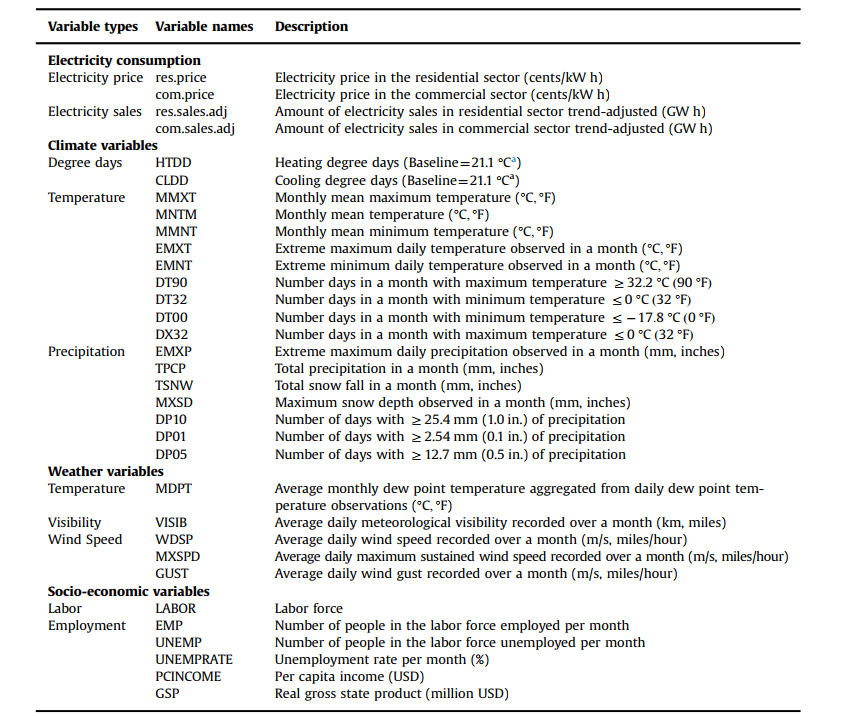

### Preparing the environment and loading the dataset

In [1]:
import matplotlib.pyplot as plt
import pandas as pd
import numpy as np
import seaborn as sns
import ipywidgets as widgets
from IPython.display import IFrame

<a href = "Final_Project.pbix">Final Project Power BI</a>

### Exploring our Dataset

In [2]:
IFrame('https://app.powerbi.com/view?r=eyJrIjoiN2E2M2RkZGMtNDVmMC00ODJiLTlkYTUtMzU3NzM0MjViMmVlIiwidCI6ImUwNDhkZjczLWU1MDMtNDdmNC04ZWMxLWQ4YmM1NGI3NzNhNSIsImMiOjF9', width=800, height=600)

In [3]:
dataset=pd.read_csv('Energy_Dataset.csv')

In [4]:
dataset=dataset.iloc[:,2:]
dataset.head()

,res_price,res_sales,com_price,com_sales,EMXP,MXSD,TPCP,TSNW,EMXT,EMNT,...,MWSPD,GUST,HTDD,CLDD,LABOR,EMP,UNEMP,UNEMPRATE,PCINCOME,GSP
0,7.68,9204.26,6.74,5629.84,1.37,0.0,3.594,0.0,84.81,43.40,...,12.50,19.12,223.42,29.99,6382604,6016520,366084,5.7,29590.85,418825
1,7.84,6760.42,6.67,5779.63,1.39,0.0,2.713,0.0,85.94,44.18,...,14.57,21.21,122.38,49.82,6410600,6041547,369053,5.8,29590.85,418825
2,7.79,6375.71,6.65,5727.16,1.57,0.0,3.221,0.0,90.08,45.69,...,13.75,20.51,96.97,49.27,6433214,6061089,372125,5.8,29590.85,418825
3,7.90,6356.13,6.73,5835.49,1.45,0.0,3.656,0.0,94.41,58.59,...,13.54,19.99,51.11,83.56,6449388,6073585,375803,5.8,29590.85,418825
4,7.83,7481.00,6.67,6393.53,1.89,0.0,6.102,0.0,96.49,63.55,...,13.20,19.75,3.64,254.15,6460750,6080536,380214,5.9,29590.85,418825


## Selecting the response variable

In [5]:
toggle_button = widgets.ToggleButtons(
            options= dataset.columns[0:4],
            description='Response Variable:',
            disabled=False,
            button_style='')
toggle_button

ToggleButtons(description='Response Variable:', options=('res_price', 'res_sales', 'com_price', 'com_sales'), …

In [6]:
variable = toggle_button.value

In [7]:
var_res=[]
var_res.append(variable)
for i in list(dataset.columns[4:]):
    var_res.append(i)
    
res_pred = dataset.loc[:,var_res]
res_pred.describe()

,res_sales,EMXP,MXSD,TPCP,TSNW,EMXT,EMNT,MMXT,MMNT,MNTM,...,MWSPD,GUST,HTDD,CLDD,LABOR,EMP,UNEMP,UNEMPRATE,PCINCOME,GSP
count,311.000000,311.000000,311.000000,311.000000,311.000000,311.000000,311.000000,311.000000,311.000000,311.000000,...,311.000000,311.000000,311.000000,311.000000,3.110000e+02,3.110000e+02,3.110000e+02,311.000000,311.000000,311.000000
mean,8465.304984,1.673633,0.000079,4.701572,0.000049,89.359035,51.623055,81.811640,63.391672,72.600900,...,12.644598,19.826559,102.090804,168.503633,8.169720e+06,7.667068e+06,5.026525e+05,6.107717,35588.895048,638046.688103
std,1474.453341,0.691903,0.000809,2.786020,0.000614,5.343913,13.854431,7.580232,9.168380,8.341431,...,0.875108,1.093715,125.193048,139.106581,1.049814e+06,9.677048e+05,2.063104e+05,2.107040,3961.216536,129284.545592
min,5962.360000,0.220000,0.000000,0.413000,0.000000,76.770000,25.350000,64.500000,40.720000,52.620000,...,10.370000,16.670000,0.000000,1.380000,6.382604e+06,6.016520e+06,2.793080e+05,3.100000,29026.150000,418825.000000
25%,7219.120000,1.190000,0.000000,2.406000,0.000000,84.665000,39.285000,75.055000,55.490000,65.445000,...,12.055000,19.145000,0.065000,35.755000,7.168060e+06,6.799827e+06,3.563975e+05,4.500000,31631.570000,518640.000000
50%,7961.800000,1.640000,0.000000,4.002000,0.000000,90.080000,49.180000,82.780000,64.060000,73.640000,...,12.600000,19.800000,40.370000,147.120000,8.158210e+06,7.717879e+06,4.414060e+05,5.600000,36136.860000,658732.000000
75%,9970.465000,2.085000,0.000000,6.630500,0.000000,94.185000,66.350000,88.960000,72.615000,80.775000,...,13.210000,20.490000,192.510000,306.020000,9.193724e+06,8.537578e+06,5.619905e+05,7.300000,38923.220000,749292.000000
max,11594.390000,5.050000,0.008948,13.245000,0.008202,99.070000,72.870000,94.490000,76.760000,84.670000,...,15.910000,23.370000,551.170000,424.730000,9.706717e+06,9.213639e+06,1.020457e+06,11.200000,41137.500000,803690.000000


In [8]:
res_pred.corr()[variable]

res_sales    1.000000e+00
EMXP         3.444938e-01
MXSD        -4.164355e-02
TPCP         4.446076e-01
TSNW        -7.033795e-02
EMXT         4.047273e-01
EMNT         4.911424e-01
MMXT         4.544473e-01
MMNT         5.126029e-01
MNTM         4.879500e-01
DT90         4.723888e-01
DX32         3.974481e-02
DT00         5.663457e-02
DT32        -2.699181e-01
DP01         4.927678e-01
DP05         4.355238e-01
DP10         4.192962e-01
MDPT         7.494529e-01
VISIB        8.804679e-03
WDSP        -6.853982e-01
MWSPD       -3.165092e-01
GUST         3.211746e-01
HTDD        -4.776317e-01
CLDD         8.438715e-01
LABOR        9.835984e-03
EMP          1.112949e-02
UNEMP       -2.152645e-03
UNEMPRATE   -6.025299e-03
PCINCOME    -1.258341e-07
GSP         -1.175064e-07
Name: res_sales, dtype: float64

## Selecting the Predictors

In [9]:
res_var = widgets.SelectMultiple(
    options=list(res_pred.corr()[[variable]].index[1:]),
    value=(),
    rows=15,
    description='Predictors',
    disabled=False
)
res_var 

SelectMultiple(description='Predictors', options=('EMXP', 'MXSD', 'TPCP', 'TSNW', 'EMXT', 'EMNT', 'MMXT', 'MMN…

## Relationship between selected predictors and response variable

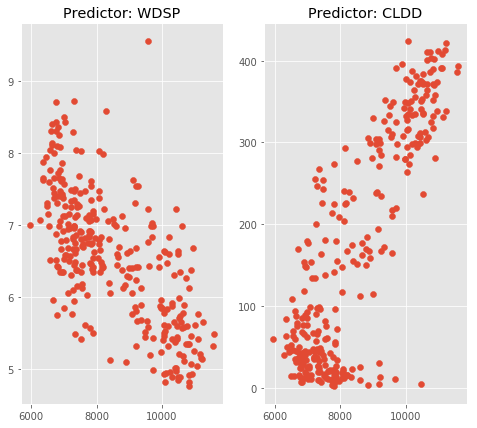

In [10]:
predictors = list(res_var.value)
y = res_pred[variable]
X = res_pred[predictors]

cols = 4
if len(predictors)<=cols:
    rows = 1
    cols = len(predictors)
    
else:
    if len(predictors)%cols == 0:
        rows = int(len(predictors)/cols)
    
    else:
        rows = int(len(predictors)/cols) + 1
               
plt.style.use('ggplot')
plt.figure(figsize=(cols*4,2*rows + 5))
plt.tight_layout()
for index in range(len(predictors)):
    plt.subplot(rows,cols, index+1)
    plt.scatter(y, X.iloc[:,index])
    plt.title('Predictor: '+ predictors[index])
plt.show()

In [11]:
if len(predictors)==2:
    import plotly.express as px
    fig = px.scatter_3d(dataset, x=predictors[0], y=predictors[1], z=variable)
    fig.show()

## Correlation Matrix

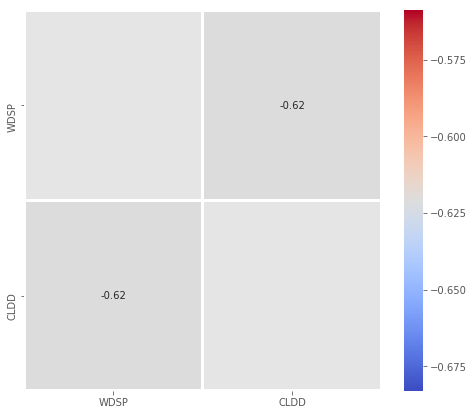

In [11]:
predictors = list(res_var.value)
corr_matrix = res_pred.loc[:,predictors].corr()
corr_matrix[corr_matrix == 1] = np.nan

plt.figure(figsize=(8, 7))
sns.heatmap(corr_matrix, annot=True, linewidths= 2, cmap='coolwarm')
plt.show()

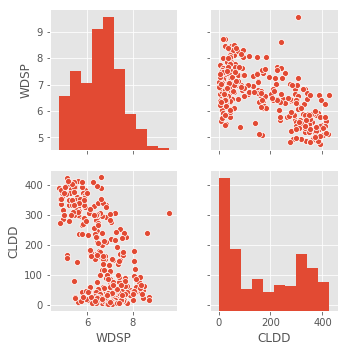

In [12]:
sns.pairplot(res_pred.loc[:,predictors])
plt.show()

## Selecting the Regression Model

In [13]:
toggle_button2 = widgets.ToggleButtons(
            options= ['Statmodel', 'SciKitLearn', 'Gradient Descent'],
            description='Model:',
            disabled=False,
            button_style='')
toggle_button2

ToggleButtons(description='Model:', options=('Statmodel', 'SciKitLearn', 'Gradient Descent'), value='Statmodel…

## Running the Model

In [14]:
model = toggle_button2.value

if model == 'Statmodel':
    import statsmodels.api as sm
    
    y = res_pred[variable]
    X = res_pred[predictors]
    
    X = sm.add_constant(X)
    rmodel=sm.regression.linear_model.OLS(y,X)
    linear_regression=rmodel.fit()
    print(linear_regression.summary())
    parameters = linear_regression.params
    
elif model=='SciKitLearn':
    from sklearn import linear_model
    
    y = res_pred[variable]
    X = res_pred[predictors]
    
    rmodel = linear_model.LinearRegression()
    rmodel  = rmodel.fit(X,y)
    print(rmodel.intercept_)
    print(rmodel.coef_)
    
elif model == 'Gradient Descent':
    
    from sklearn.preprocessing import StandardScaler

    X = res_pred[predictors]
    elements=len(X)
    standardization=StandardScaler()
    Xst = standardization.fit_transform(X)
    original_means=standardization.mean_
    original_stds=standardization.var_**0.5
    Xst = np.column_stack((Xst, np.ones(elements)))
    y = res_pred[variable]
    
    import random
    def random_w(p):
        return np.array([np.random.normal() for j in range(p)])

    def hypothesis(X,w): 
        return np.dot(X,w) # X is the matrix ()X and ()w are the coeficients (w only one column)
                         # if we multiply X.w we get the matrix y(one column)

    def loss(X,w,y): # 
        return hypothesis(X,w) - y # this is the loss function (Xw -y)

    def squared_loss(X,w,y): #(Xw -y)*2
        return loss(X,w,y)**2 

    def gradient(X,w,y): # the loop 
        gradients = list() # defining a list
        n = float(len( y )) # the lenght of the y
        for j in range(len(w)):
            gradients.append(np.sum(loss(X,w,y) * X[:,j]) / n) # generating coefficients
        return gradients #everytime we loop through we generate a coefficient and we add it to the gradient

    def update(X,w,y, alpha=0.01): # alpha value by default
        return [t - alpha*g for t, g in zip(w, gradient(X,w,y))]

    def optimize(X, y, alpha = 0.01, eta = 10*-12, iterations = 1000):
        w=random_w(X.shape[1])
        path = list()
        for k in range(iterations):
            SSL = np.sum(squared_loss(X, w, y))
            new_w = update(X, w, y, alpha= alpha)
            new_SSL= np.sum(squared_loss(X, new_w,y))
            w = new_w
            if k >= 5 and (new_SSL -SSL <= eta and new_SSL - SSL > -eta):
                path.append(new_SSL)
                return w, path
            if k%(iterations /20)==0:
                path.append(new_SSL)
        return w, path
    
    alpha = 0.02
    w, path = optimize(Xst, y, alpha, eta = 10**-12, iterations=20000)
    
    unstandardized_betas = w[:-1] / original_stds
    unstandardized_bias = w[-1]-np.sum((original_means /
    original_stds) * w[:-1])
    print ('%8s: %8.4f' % ('bias', unstandardized_bias))
    for beta,varname in zip(unstandardized_betas, predictors):
        print ('%8s: %8.4f' % (varname, beta))

                            OLS Regression Results                            
Dep. Variable:              res_sales   R-squared:                       0.755
Model:                            OLS   Adj. R-squared:                  0.753
Method:                 Least Squares   F-statistic:                     473.3
Date:                Tue, 15 Oct 2019   Prob (F-statistic):           1.15e-94
Time:                        17:42:31   Log-Likelihood:                -2491.5
No. Observations:                 311   AIC:                             4989.
Df Residuals:                     308   BIC:                             5000.
Df Model:                           2                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
const       1.002e+04    424.741     23.589      0.0

c:\python 3.7\lib\site-packages\numpy\core\fromnumeric.py:2389: FutureWarning:

Method .ptp is deprecated and will be removed in a future version. Use numpy.ptp instead.



### Visualizing the regression surface << if possible >>

In [20]:
if len(predictors)==2 and model == 'Statmodel':
    x_min = res_pred[predictors[0]].min()
    x_max = res_pred[predictors[0]].max()

    y_min = res_pred[predictors[1]].min()
    y_max = res_pred[predictors[1]].max()

    xx, yy = np.meshgrid(np.linspace(x_min, x_max, 300), np.linspace(y_min, y_max, 300))

    zz = parameters.const + xx*parameters[predictors[0]] + yy*parameters[predictors[1]]
    
    import plotly.graph_objects as go
    import plotly.express as px
    
    trace1 = trace1 = go.Scatter3d(
        x=dataset[predictors[0]],
        y=dataset[predictors[1]],
        z=dataset[variable],
        mode='markers'
    )
    
    
    trace2 = go.Surface(z=zz, x=xx, y=yy, colorscale='Greys', opacity=0.75)
    
    data_test1 = go.Data([trace1, trace2])
    
    fig = go.Figure(data=data_test1)
    
    fig.show()   

## Conclusion

We built an interactive report where any user can select the response variable, the predictors and the model in order to estimate the price and the energy comsumption regardles of the economic sector.